In [1]:
%pip install pandas_montecarlo --upgrade --no-cache-dir
%pip install powerlaw


     |████████████████████████████████| 11.5 MB 3.6 MB/s eta 0:00:01
     |████████████████████████████████| 11.2 MB 62.1 MB/s eta 0:00:01
     |████████████████████████████████| 885 kB 58.9 MB/s eta 0:00:01
     |████████████████████████████████| 15.7 MB 61.1 MB/s eta 0:00:01
     |████████████████████████████████| 1.6 MB 46.0 MB/s eta 0:00:01
     |████████████████████████████████| 3.1 MB 50.9 MB/s eta 0:00:01
     |████████████████████████████████| 503 kB 63.5 MB/s eta 0:00:01
  Created wheel for pandas-montecarlo: filename=pandas_montecarlo-0.0.2-py3-none-any.whl size=7564 sha256=37abf9e8cdc3936006f27100f67610369e0cbad772764caf8c4ad9636efdf8ed
  Stored in directory: /tmp/pip-ephem-wheel-cache-u7okjrax/wheels/74/a2/89/884066d0b8d28a7411fca5f484f11d797bb7bb3c14b53e352c
Successfully built pandas-montecarlo
Note: you may need to restart the kernel to use updated packages.
     |████████████████████████████████| 39.8 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 532 kB

In [4]:
%pip install xlrd

     |████████████████████████████████| 96 kB 2.2 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import pandas_montecarlo
import powerlaw
from IPython.display import Image

# Agenda

> One trader (himself a former quant) built the following strategy in dealing with the research department people. When communicating with him, they were advised to do the following:

> 1. In a single sentence, explain the conclusion, before discussing the subject matter.
> 2. In a single sentence, explain the subject matter.
> 3. If unable to perform 1 or 2, then abandon the entire project.
> 
> _Nassim Taleb, Dynamic Hedging_

For monthly, weekly and daily timeframes
- Establish that distribution is not normal (use d-tale)
- Establish that *all* the value lies in the tail 
- Determine at what price are options cost effective (back testing) - pure barbell
- Determine at what price is insurance for a long only portfolio cost effective (back testing)
- Monte Carlo and bust probabilities 
- TODO
    - Capturing the 4th moment strategy 
    - Understand how to make use of the Hill estimator and more sophisticated stuff.
    - Where do tails start? https://arxiv.org/pdf/1401.2524.pdf NNT Paper

## Warning: There may be bugs!
But: The bugs in code are easily solvable, the bugs in our minds... 

### Shiller monthly data S&P 500

<http://www.econ.yale.edu/~shiller/data.htm>

In [5]:
# From shiller 
df = pd.read_excel("ie_data.xls", "Data")


In [6]:
df[7:].head(20)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21
7,1871.01,4.44,0.26,0.4,12.464061,1871.041667,5.32,97.250271,5.694836,97.250271,...,NaN,NaN,NaN,NaN,NaN,1.004177,1,0.130609,0.092504,0.038106
8,1871.02,4.5,0.26,0.4,12.844641,1871.125,5.323333,95.644049,5.526101,96.104557,...,NaN,NaN,NaN,NaN,NaN,1.00418,0.974424,0.130858,0.094635,0.036224
9,1871.03,4.61,0.26,0.4,13.034972,1871.208333,5.326667,96.551327,5.445411,97.472173,...,NaN,NaN,NaN,NaN,NaN,1.004183,0.964209,0.130951,0.096186,0.034765
10,1871.04,4.74,0.26,0.4,12.559226,1871.291667,5.33,103.034548,5.651684,104.492692,...,NaN,NaN,NaN,NaN,NaN,1.004185,1.004919,0.122056,0.090972,0.031084
11,1871.05,4.86,0.26,0.4,12.273812,1871.375,5.333333,108.099637,5.783108,110.118209,...,NaN,NaN,NaN,NaN,NaN,1.004188,1.032591,0.122638,0.089488,0.03315
12,1871.06,4.82,0.26,0.4,12.083481,1871.458333,5.336667,108.898625,5.8742,111.430773,...,NaN,NaN,NaN,NaN,NaN,1.004191,1.053249,0.123093,0.087725,0.035368
13,1871.07,4.73,0.26,0.4,12.083481,1871.541667,5.34,106.865248,5.8742,109.851015,...,NaN,NaN,NaN,NaN,NaN,1.004194,1.057663,0.120022,0.086581,0.033441
14,1871.08,4.79,0.26,0.4,11.893231,1871.625,5.343333,109.951982,5.968166,113.535234,...,NaN,NaN,NaN,NaN,NaN,1.004197,1.079088,0.111933,0.082669,0.029264
15,1871.09,4.84,0.26,0.4,12.178646,1871.708333,5.346667,108.496009,5.828298,112.533332,...,NaN,NaN,NaN,NaN,NaN,1.004199,1.058222,0.110028,0.081048,0.02898
16,1871.1,4.59,0.26,0.4,12.368896,1871.791667,5.35,101.309267,5.738651,105.575174,...,NaN,NaN,NaN,NaN,NaN,1.004202,1.04632,0.114765,0.081653,0.033113


Stdev monthly  4.0696146685580254  max  50.29940119760481  min  -26.473740621650588


<AxesSubplot:title={'center':'Monthly changes, sorted (excluding body)'}>

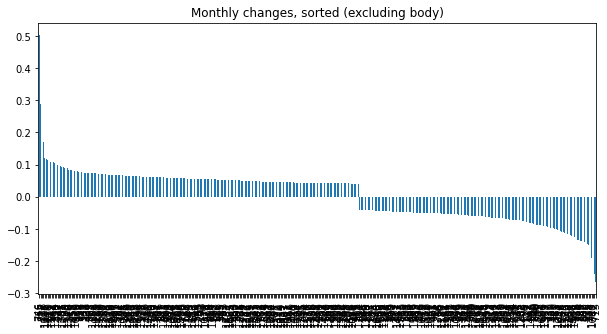

In [7]:
# get percent change m-o-m
monthly = df[7:1808].copy()
monthly.rename(columns={"Unnamed: 1": "close"}, inplace=True)
monthly["pct"] = pd.to_numeric(monthly["close"]).pct_change()
stdev_m = monthly["pct"].std()
# print stdev as percentage
print("Stdev monthly ", stdev_m * 100, " max ", monthly["pct"].max() * 100, " min ", monthly["pct"].min() * 100)
# Sort and plot monthly extreme values
monthly[(monthly["pct"] > stdev_m) | (monthly["pct"] < -stdev_m)].sort_values(
    by="pct", ascending=False
)["pct"].plot(kind="bar", figsize=(10, 5), title="Monthly changes, sorted (excluding body)")


<AxesSubplot:title={'center':'Monthly DOW'}>

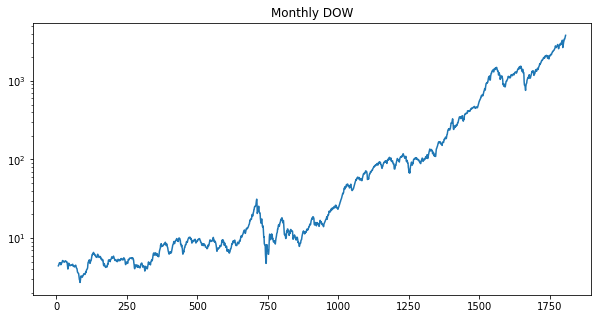

In [8]:
monthly["close"].plot(logy=True, figsize=(10, 5), title="Monthly DOW")

### Daily data for DOW from NASDAQ and Yahoo Finance

<https://data.nasdaq.com/data/BCB/UDJIAD1-dow-jones-industrial-average>
<https://finance.yahoo.com/quote/%5EDJI/history/>

In [10]:
df5 = pd.read_csv("USETHIS.csv")
df5 = df5[5400:] # Because mkt was closed for 6mo

df5.head(10)
df5['Datetime'] = pd.to_datetime(df5['Date'])
df5.set_index(['Datetime'], inplace=True)
df5['Value'] = df5['Value'].str.replace(',', '').astype(float)
df5["Value"] = pd.to_numeric(df5["Value"], downcast="float")

Stdev weekly  2.5032687932252884  max  22.668635845184326  min  -18.151289224624634


<AxesSubplot:title={'center':'Weekly changes, sorted (excluding body)'}, xlabel='Datetime'>

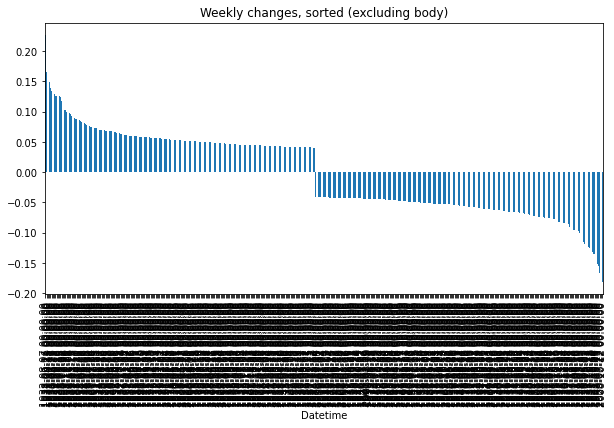

In [11]:
weekly = df5["Value"].resample("W").ohlc()
weekly["pct"] = weekly["close"].pct_change()
weekly.head()
stdev_w = weekly["pct"].std()
print("Stdev weekly ", stdev_w * 100, " max ", weekly["pct"].max() * 100, " min ", weekly["pct"].min() * 100)
# Sort and plot weekly extreme values
weekly[(weekly["pct"] > stdev_m) | (weekly["pct"] < -stdev_m)].sort_values(
    by="pct", ascending=False
)["pct"].plot(kind="bar", figsize=(10, 5), title="Weekly changes, sorted (excluding body)")


### Changes in the stdev over time - weekly

<AxesSubplot:title={'center':'Weekly stdev over time'}, xlabel='Datetime'>

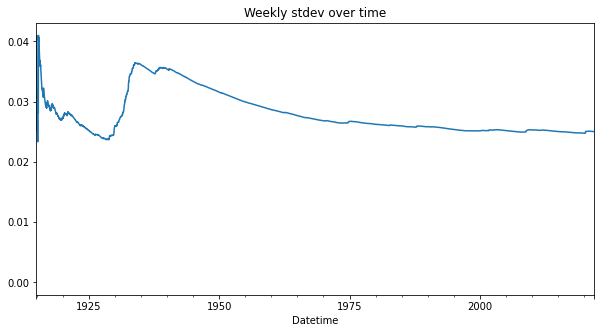

In [12]:

stdevOverTime = [0]
for i in range(1, len(weekly)):
    stdevOverTime.append(weekly["pct"][0:i].std())
weekly["stdev"] = stdevOverTime
weekly["stdev"].plot(kind="line", figsize=(10, 5), title="Weekly stdev over time")

Stdev daily  0.9442564100027084  max  15.341746807098389  min  -22.610539197921753


<AxesSubplot:title={'center':'Daily changes, sorted (excluding body)'}, xlabel='Datetime'>

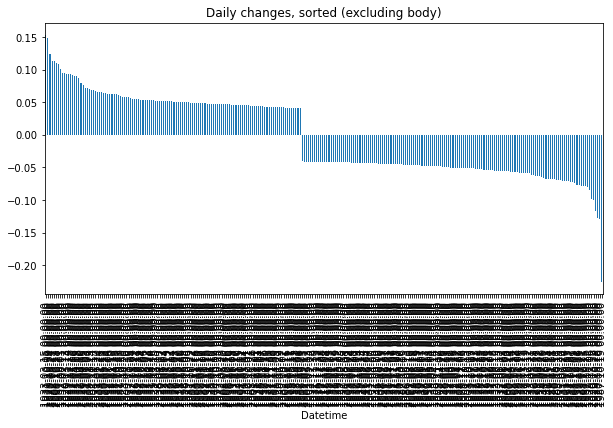

In [13]:
daily = df5["Value"].resample("1D").ohlc()
daily["pct"] = daily["close"].pct_change()
daily.head()
stdev_d = daily["pct"].std()
print("Stdev daily ", stdev_d * 100, " max ", daily["pct"].max() * 100, " min ", daily["pct"].min() * 100)
# Sort and plot daily extreme values
daily[(daily["pct"] > stdev_m) | (daily["pct"] < -stdev_m)].sort_values(
    by="pct", ascending=False
)["pct"].plot(kind="bar", figsize=(10, 5), title="Daily changes, sorted (excluding body)")


<AxesSubplot:title={'center':'Daily stdev over time'}, xlabel='Datetime'>

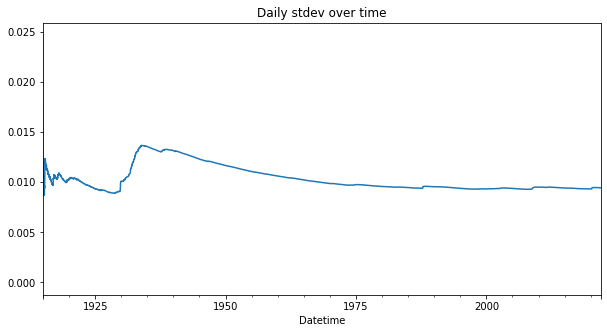

In [14]:

stdevOverTime = [0]
for i in range(1, len(daily)):
    stdevOverTime.append(daily["pct"][0:i].std())
daily["stdev"] = stdevOverTime
daily["stdev"].plot(kind="line", figsize=(10, 5), title="Daily stdev over time")

#### NOTE: a sudden jump in stdev that we see in the daily and weekly stdev graphs is *not* expected in a Gaussian distribution. In a Gaussian, the stdev necessarily converges as we add more observations. This is our first indicator that we may not be dealing with a Gaussian

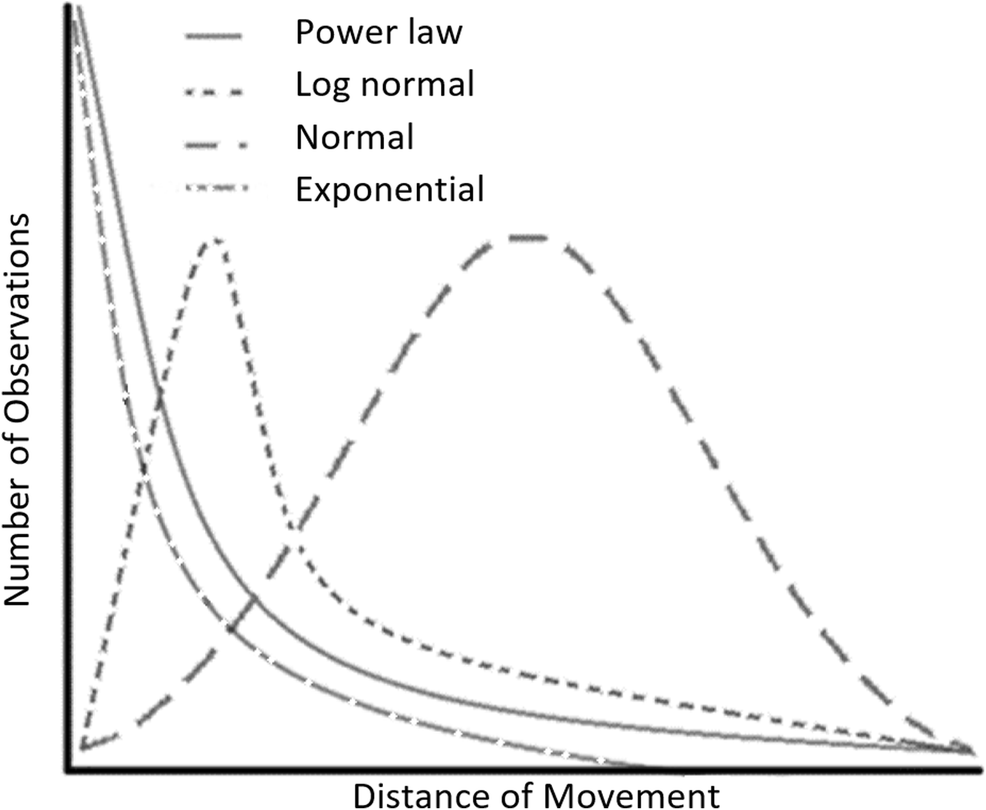

In [24]:

Image(filename='13421_2020_1015_Fig2_HTML.png', width=500)

## Best fit distribution

Note: Models fit data, data doesn't fit models! (Don't teach birds how to fly)

### Daily

In [15]:
results_d = powerlaw.Fit(daily["pct"].abs())
R, p = results_d.distribution_compare('power_law', 'lognormal')
# R is the loglikelihood ratio between the two candidate distributions. This number will be positive
# if the data is more likely in the first distribution, and negative if the data is more likely in the second
# distribution.
print(" R ", R, " p ", p)
# If those methods gave you a p > 0.1 for the upper-tail fit, then you're allowed to say that the upper tail 
# is plausibly power-law distributed. If the methods gave you  p < 0.1
# then you can't say that, even if the fit looks good to the eye.
# https://stats.stackexchange.com/questions/26903/interpreting-the-difference-between-lognormal-and-power-law-distribution-networ

Values less than or equal to 0 in data. Throwing out 0 or negative values


Calculating best minimal value for power law fit
 R  -8.402314367918732  p  0.01882172064631554


[]

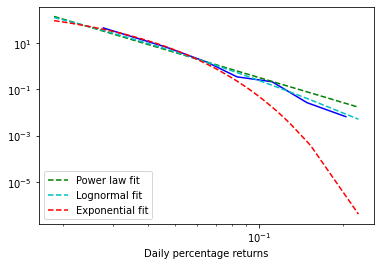

In [16]:
fig = results_d.plot_pdf(color="b")
#results_d.plot_pdf(linestyle='--', color="y", linear_bins=True)
results_d.power_law.plot_pdf(linestyle='--', color='g', label='Power law fit')
results_d.lognormal.plot_pdf(linestyle='--', color='c', label='Lognormal fit')
results_d.exponential.plot_pdf(linestyle='--', color='r', label='Exponential fit')
handles, labels = fig.get_legend_handles_labels()
fig.legend(handles, labels, loc=3)
fig.set_xlabel("Daily percentage returns")
#savefig(figname+'.eps', bbox_inches='tight')
fig.plot()

When fitting a power law to a data set, one should compare the goodness of fit to that of a lognormal distribution. This is done because lognormal distributions are another heavy-tailed distribution, but they can be generated by a very simple process: multiplying random positive variables together. The lognormal is thus much like the normal distribution, which can be created by adding random variables together; in fact, the log of a lognormal distribution is a normal distribution (hence the name), and the exponential of a normal distribution is the lognormal (which maybe would be better called an expnormal). In contrast, creating a power law generally requires fancy or exotic generative mechanisms (this is probably why you're looking for a power law to begin with; they're sexy). So, even though the power law has only one parameter (alpha: the slope) and the lognormal has two (mu: the mean of the random variables in the underlying normal and sigma: the standard deviation of the underlying normal distribution), we typically consider the lognormal to be a simpler explanation for observed data, as long as the distribution fits the data just as well. For most data sets, a power law is actually a worse fit than a lognormal distribution, or perhaps equally good, but rarely better. This fact was one of the central empirical results of the paper Clauset et al. 2007.
From: https://github.com/jeffalstott/powerlaw/blob/06e3f0315f26819f26b847d9bbe7e0885c2b4ca1/README.rst#L93

In [17]:
print ("Xmin ", results_d.xmin * 100, "%. Mu and sigma: ", results_d.lognormal.mu, results_d.lognormal.sigma)

# optimal xmin beyond which the scaling regime of the power law fits best. It is identified by minimizing 
# the Kolmogorov-Smirnov distance between the data and the theoretical power law fit. 
# This is the method of Clauset et al. 2007.


Xmin  1.8534421920776367 %. Mu and sigma:  -6.525279940632799 1.117207414048857


### Weekly

In [18]:
results_w = powerlaw.Fit(weekly["pct"].abs())
R, p = results_w.distribution_compare('power_law', 'lognormal')
# R is the loglikelihood ratio between the two candidate distributions. This number will be positive
# if the data is more likely in the first distribution, and negative if the data is more likely in the second
# distribution.
print(R, p)

Calculating best minimal value for power law fit


Values less than or equal to 0 in data. Throwing out 0 or negative values


-5.804021299503933 0.033112173697350325


[]

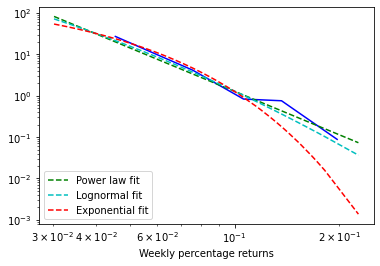

In [19]:
fig = results_w.plot_pdf(color="b")
#results_w.plot_pdf(linestyle='--', color="y", linear_bins=True)
results_w.power_law.plot_pdf(linestyle='--', color='g', label='Power law fit')
results_w.lognormal.plot_pdf(linestyle='--', color='c', label='Lognormal fit')
results_w.exponential.plot_pdf(linestyle='--', color='r', label='Exponential fit')
handles, labels = fig.get_legend_handles_labels()
fig.legend(handles, labels, loc=3)

fig.set_xlabel("Weekly percentage returns")
#savefig(figname+'.eps', bbox_inches='tight')
fig.plot()


In [20]:
print ("Xmin ", results_w.xmin * 100, "%. Mu and sigma: ", results_w.lognormal.mu, results_w.lognormal.sigma)
# optimal xmin beyond which the scaling regime of the power law fits best. It is identified by minimizing 
# the Kolmogorov-Smirnov distance between the data and the theoretical power law fit. 
# This is the method of Clauset et al. 2007.


Xmin  3.030383586883545 %. Mu and sigma:  -5.312542370901247 1.009796982278436


## *One who knows, does not speak. One who speaks, does not know.* -Tao Te Ching

# Does the tail contain all the information? 

* we try with cost of options = 0 first

In [21]:
def gainFn(row, threshold):
    """ Function which returns the gains of an options contract."""
    if row["pct"] > threshold:
        return row["pct"] - threshold
    elif -row["pct"] > threshold:
        return -row["pct"] - threshold
    else:
        return 0

def tailCapture(df, winThreshold, gainFn=gainFn):
    df["gain_pct"] = df.apply(lambda row: gainFn(row, winThreshold), axis=1)

    startingPortfolioVal = df.head(1)["close"].values[0]
    portfolioVal = startingPortfolioVal
    oldPfVal = startingPortfolioVal  # Only for sanity checks
    pfList = [startingPortfolioVal]
    # shift the gain by 1 week for comparison and iterate over all rows of df
    for _, row in df.shift(-1).iterrows():
        if np.isnan(row["gain_pct"]):
            continue
        portfolioVal = portfolioVal + (portfolioVal * row["gain_pct"])
        oldPfVal += oldPfVal * row["pct"] # For sanity checks
        pfList.append(portfolioVal)
    df["portfolio"] = pfList
    print(
        "Strategy ending val ",
        portfolioVal,
        "Discrete periods ",
        len(pfList),
        len(df),
        "Ending val buy and hold ",
        df.tail(1)["close"].values[0],
        oldPfVal,
    )


In [22]:
def plot(df, winThreshold, miny=-1, maxy=1):
    wins = df[(df["pct"] > winThreshold) | (df["pct"] < -winThreshold)][
        ["pct", "gain_pct"]
    ]
    wins.plot(
        kind="bar",
        ylim=(miny, maxy),
        figsize=(20, 6),
        grid=True,
        yticks=tuple(np.arange(miny, maxy, 0.1)),
    )
    print(wins.describe(), "\n", wins)
    # Longest seq of zeros
    s = df["gain_pct"] == 0
    print("Longest streak of 0s: ", (~s).cumsum()[s].value_counts().max())
    # Longest seq of non-zeros
    s = df["gain_pct"] != 0
    print("Longest streak of non 0s: ", (~s).cumsum()[s].value_counts().max())
    df[["portfolio", "close"]].plot(figsize=(20, 6), grid=True, logy=True)


def montecarlo(df, title, col):
    mc = df[col].montecarlo(sims=100, bust=-0.25, goal=2)
    mc.plot(title=title, figsize=(20, 6))
    print(title, mc.stats)


#### Monthly, 1 SD

Strategy ending val  117269.03930371544 Discrete periods  1801 1801 Ending val buy and hold  3793.748421052632 3793.748421052611
              pct    gain_pct
count  395.000000  395.000000
mean     0.004781    0.026755
std      0.077602    0.038521
min     -0.264737    0.000041
25%     -0.054922    0.006402
50%      0.042697    0.016186
75%      0.057282    0.031290
max      0.502994    0.462298 
            pct  gain_pct
16   -0.051653  0.010957
39   -0.076459  0.035763
40   -0.087146  0.046450
42    0.094059  0.053363
43    0.054299  0.013602
...        ...       ...
1798  0.041314  0.000618
1799  0.057075  0.016379
1800  0.063380  0.022684
1802  0.057392  0.016696
1806  0.041228  0.000532

[395 rows x 2 columns]
Longest streak of 0s:  48
Longest streak of non 0s:  7


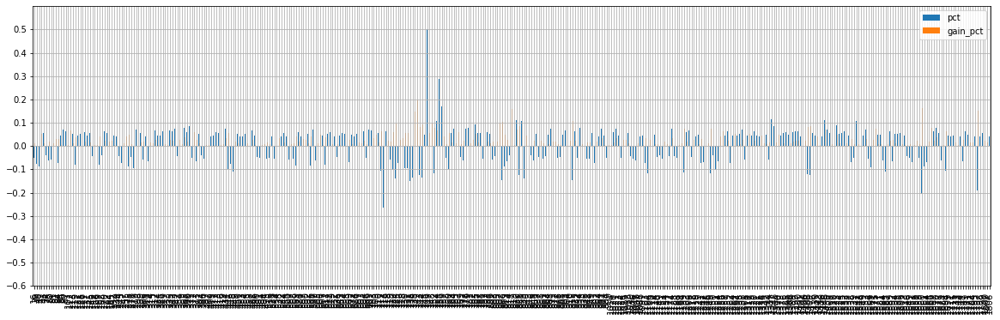

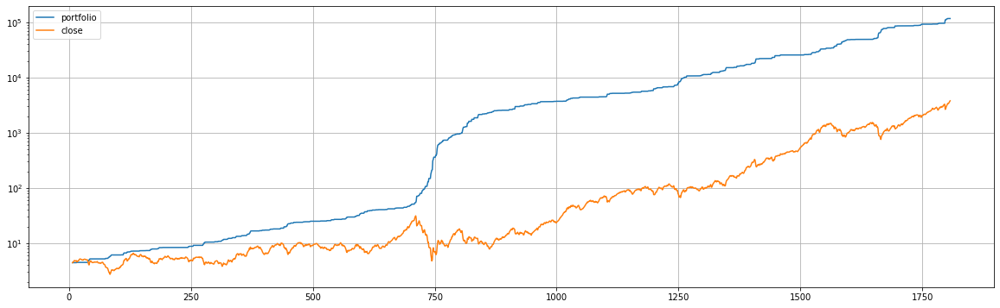

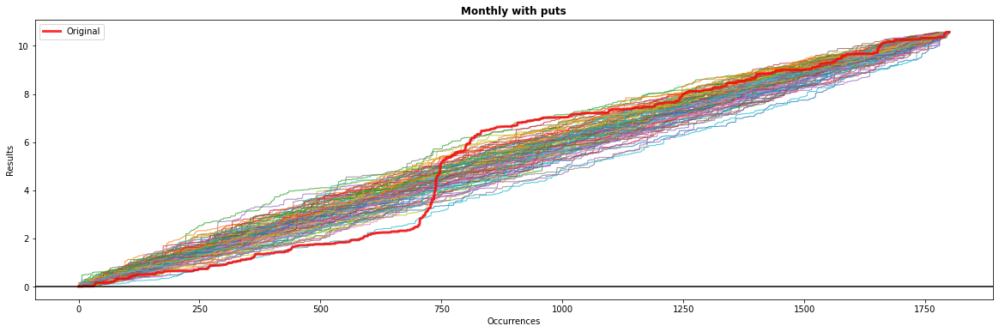

Monthly with puts {'min': 10.568074679105996, 'max': 10.568074679106022, 'mean': 10.568074679106013, 'median': 10.568074679106012, 'std': 6.0120023606675186e-15, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


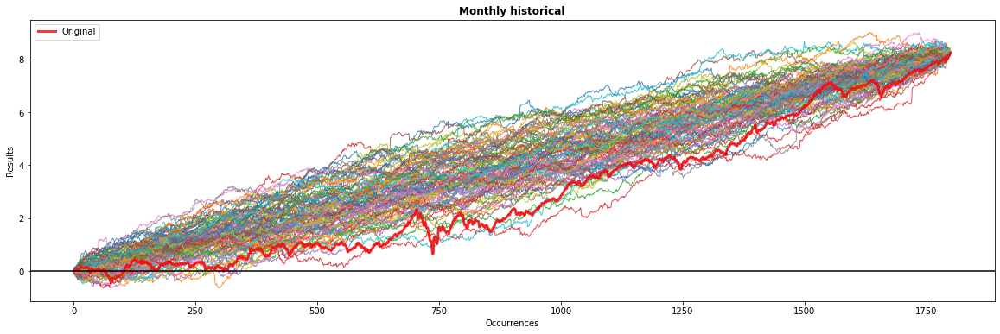

Monthly historical {'min': 8.25013233187921, 'max': 8.250132331879247, 'mean': 8.250132331879225, 'median': 8.250132331879227, 'std': 8.667471183185468e-15, 'maxdd': -0.6478983621597072, 'bust': 0.26, 'goal': 0.74}


In [23]:
tailCapture(monthly, stdev_m)   
plot(monthly, stdev_m, miny=-0.6, maxy=0.6)
montecarlo(monthly, "Monthly with puts", "gain_pct")
montecarlo(monthly, "Monthly historical", "pct")

#### Monthly 2 SD

Strategy ending val  79.7128222647148 Discrete periods  1801 1801 Ending val buy and hold  3793.748421052632 3793.748421052611
             pct   gain_pct
count  70.000000  70.000000
mean   -0.035129   0.043708
std     0.135881   0.061958
min    -0.264737   0.000462
25%    -0.120222   0.010923
50%    -0.092605   0.026120
75%     0.091630   0.050254
max     0.502994   0.421602 
            pct  gain_pct
40   -0.087146  0.005754
42    0.094059  0.012667
112   0.109005  0.027612
275  -0.088512  0.007120
277  -0.093275  0.011883
...        ...       ...
1660 -0.203911  0.122519
1661 -0.088522  0.007130
1666  0.120217  0.038825
1694 -0.105555  0.024162
1797 -0.190681  0.109288

[70 rows x 2 columns]
Longest streak of 0s:  188
Longest streak of non 0s:  3


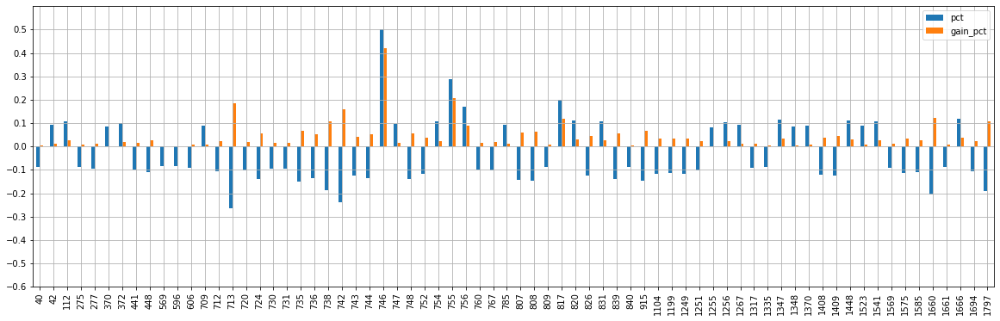

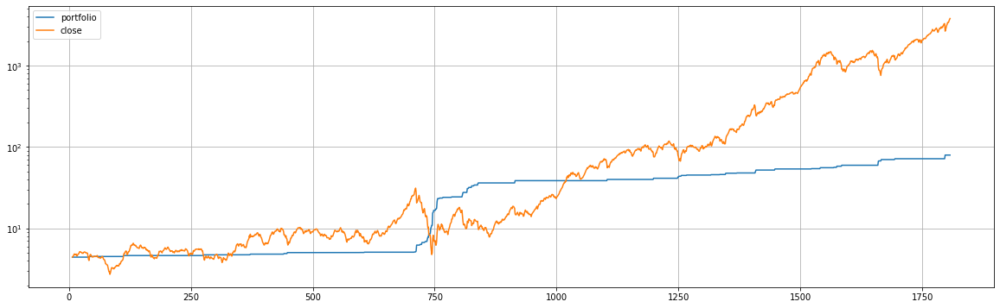

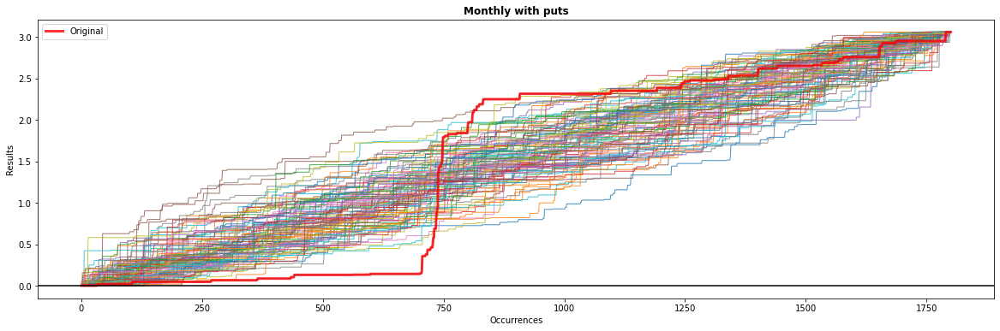

Monthly with puts {'min': 3.0595460908036385, 'max': 3.0595460908036416, 'mean': 3.05954609080364, 'median': 3.0595460908036403, 'std': 9.394085032035757e-16, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


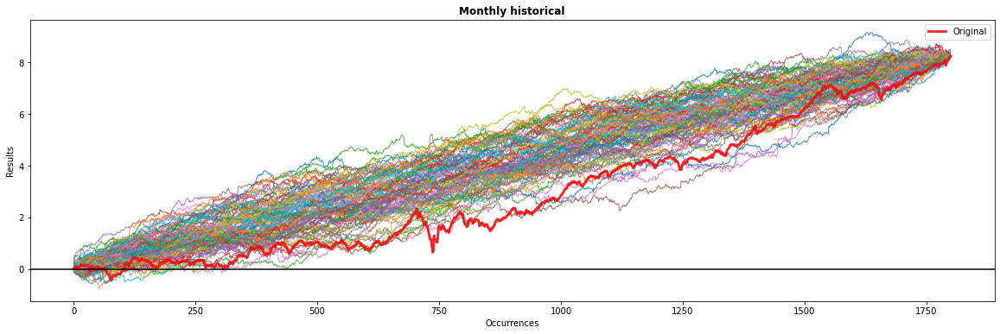

Monthly historical {'min': 8.250132331879206, 'max': 8.250132331879241, 'mean': 8.250132331879227, 'median': 8.250132331879225, 'std': 8.291587491777854e-15, 'maxdd': -0.7505816279653708, 'bust': 0.19, 'goal': 0.81}


In [24]:

tailCapture(monthly, stdev_m*2)   
plot(monthly, stdev_m*2, miny=-0.6, maxy=0.6)
montecarlo(monthly, "Monthly with puts", "gain_pct")
montecarlo(monthly, "Monthly historical", "pct")

In [25]:
monthly[["close", "pct", "gain_pct", "portfolio"]].head(40).tail(20)

,close,pct,gain_pct,portfolio
27,4.95,-0.017857,0.000000,4.440000
28,4.97,0.004040,0.000000,4.440000
29,4.95,-0.004024,0.000000,4.440000
30,5.07,0.024242,0.000000,4.440000
31,5.11,0.007890,0.000000,4.440000
32,5.15,0.007828,0.000000,4.440000
33,5.11,-0.007767,0.000000,4.440000
34,5.04,-0.013699,0.000000,4.440000
35,5.05,0.001984,0.000000,4.440000
36,4.98,-0.013861,0.000000,4.440000


#### Weekly 2 SD

Strategy ending val  32449.949832745588 Discrete periods  5582 5582 Ending val buy and hold  34483.72 34483.66855370661
              pct    gain_pct
count  270.000000  270.000000
mean    -0.006267    0.024262
std      0.079256    0.027854
min     -0.181513    0.000242
25%     -0.066454    0.006176
50%     -0.051956    0.014767
75%      0.060448    0.030299
max      0.226686    0.176621 
                  pct  gain_pct
Datetime                      
1915-04-11  0.059522  0.009457
1915-04-18  0.068304  0.018238
1915-05-09 -0.122221  0.072155
1915-05-23  0.057646  0.007580
1915-06-06  0.060152  0.010086
...              ...       ...
2020-04-12  0.126675  0.076610
2020-06-07  0.068072  0.018006
2020-06-14 -0.055529  0.005463
2020-11-01 -0.064723  0.014658
2020-11-08  0.068743  0.018678

[270 rows x 2 columns]
Longest streak of 0s:  620
Longest streak of non 0s:  8


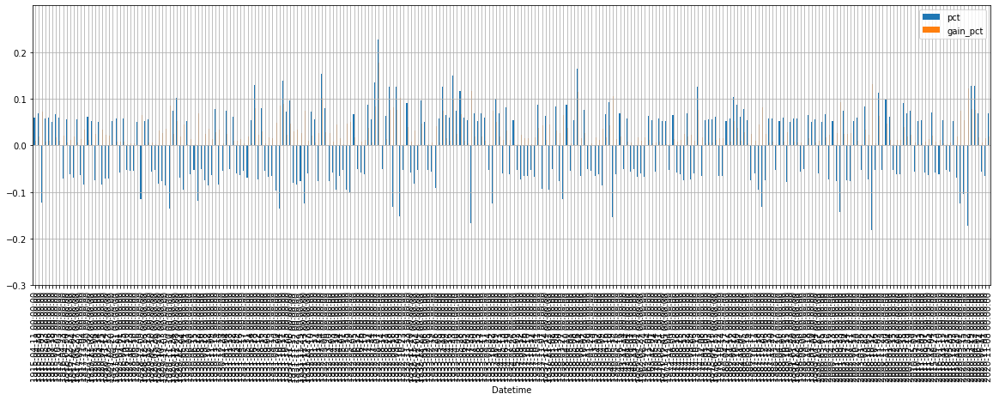

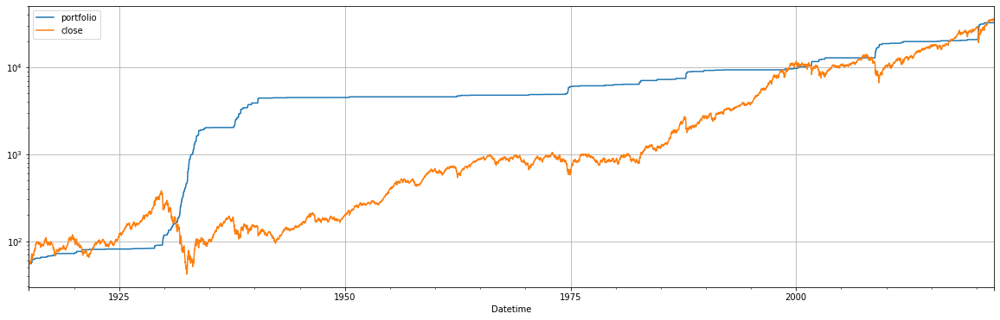

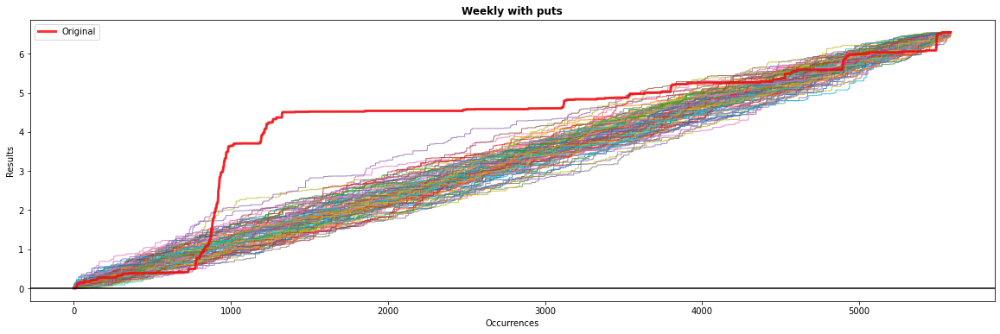

Weekly with puts {'min': 6.550715997815132, 'max': 6.550715997815132, 'mean': 6.550715997815132, 'median': 6.550715997815132, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


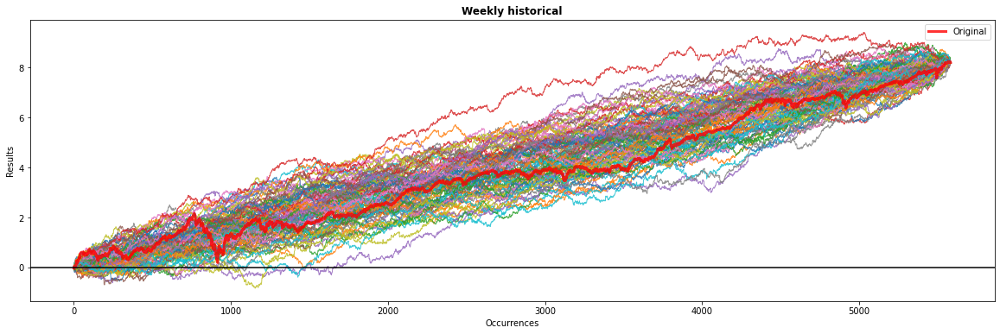

Weekly historical {'min': 8.198765, 'max': 8.19881, 'mean': 8.198786, 'median': 8.198785, 'std': 8.82077e-06, 'maxdd': -0.8347594, 'bust': 0.25, 'goal': 0.75}


In [26]:
tailCapture(weekly, stdev_w*2)   
plot(weekly, stdev_w*2, miny=-0.3, maxy=0.3)
montecarlo(weekly, "Weekly with puts", "gain_pct")
montecarlo(weekly, "Weekly historical", "pct")

#### Weekly 2 SD, Puts-only, calls-only

Strategy ending val  1001.0715237562532 Discrete periods  5582 5582 Ending val buy and hold  34483.72 34483.66855370661
              pct    gain_pct
count  270.000000  270.000000
mean    -0.006267    0.011037
std      0.079256    0.022903
min     -0.181513    0.000000
25%     -0.066454    0.000000
50%     -0.051956    0.000000
75%      0.060448    0.010382
max      0.226686    0.176621 
                  pct  gain_pct
Datetime                      
1915-04-11  0.059522  0.009457
1915-04-18  0.068304  0.018238
1915-05-09 -0.122221  0.000000
1915-05-23  0.057646  0.007580
1915-06-06  0.060152  0.010086
...              ...       ...
2020-04-12  0.126675  0.076610
2020-06-07  0.068072  0.018006
2020-06-14 -0.055529  0.000000
2020-11-01 -0.064723  0.000000
2020-11-08  0.068743  0.018678

[270 rows x 2 columns]
Longest streak of 0s:  1086
Longest streak of non 0s:  4


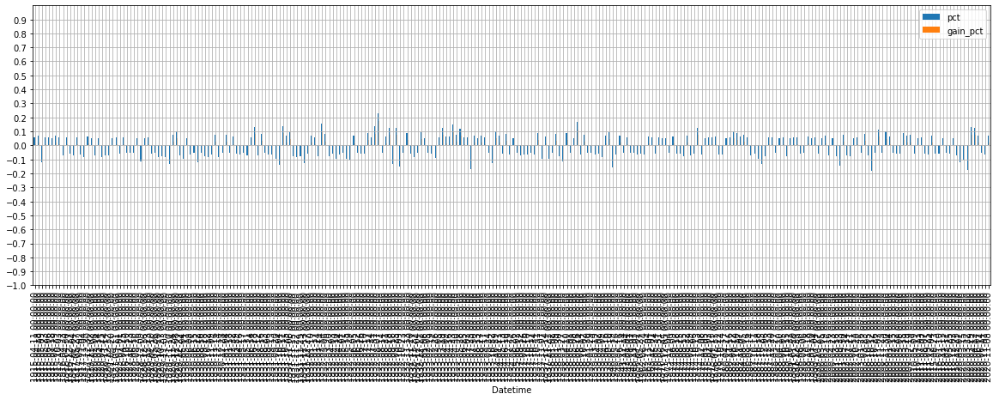

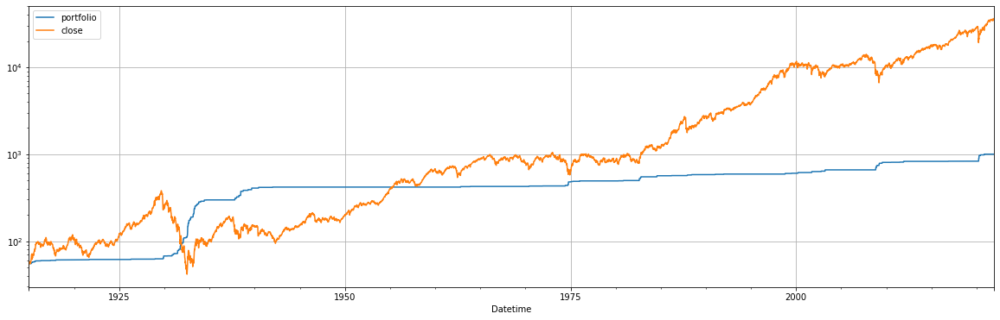

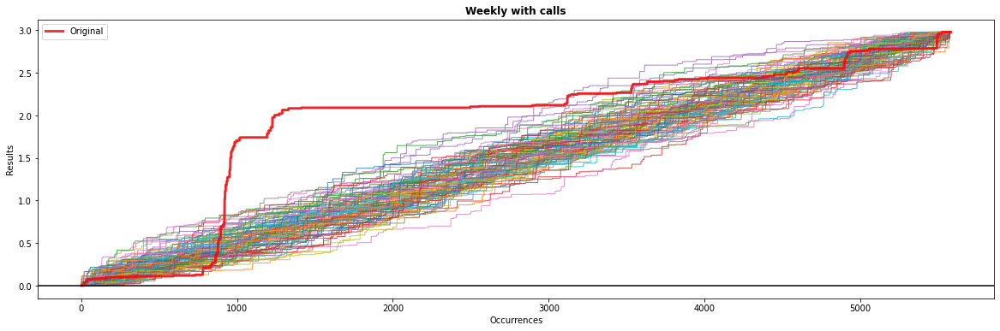

Weekly with calls {'min': 2.9800523817539215, 'max': 2.9800523817539215, 'mean': 2.9800523817539215, 'median': 2.9800523817539215, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


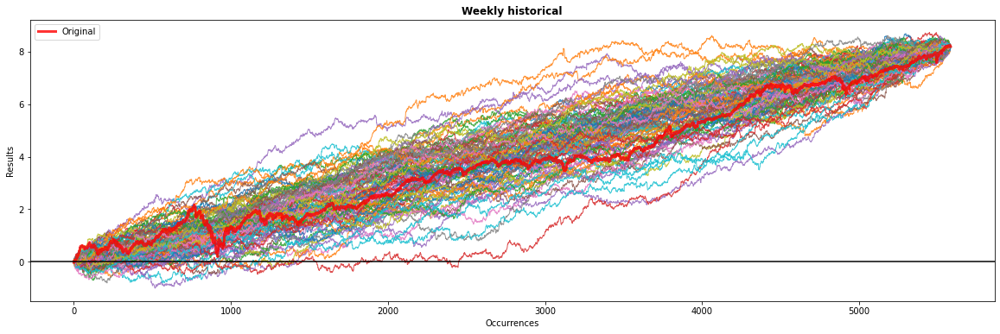

Weekly historical {'min': 8.198765, 'max': 8.198806, 'mean': 8.198784, 'median': 8.198784, 'std': 7.978614e-06, 'maxdd': -1.0144322, 'bust': 0.37, 'goal': 0.63}


In [27]:
def gainFnCallsOnly(row, threshold):
    """ Function which returns the gains of an options contract."""
    if row["pct"] > threshold:
        return row["pct"] - threshold
    else:
        return 0

tailCapture(weekly, stdev_w*2, gainFn=gainFnCallsOnly)   
plot(weekly, stdev_w*2)
montecarlo(weekly, "Weekly with calls", "gain_pct")
montecarlo(weekly, "Weekly historical", "pct")

Strategy ending val  1789.3199566837782 Discrete periods  5582 5582 Ending val buy and hold  34483.72 34483.66855370661
              pct    gain_pct
count  270.000000  270.000000
mean    -0.006267    0.013225
std      0.079256    0.023330
min     -0.181513    0.000000
25%     -0.066454    0.000000
50%     -0.051956    0.001890
75%      0.060448    0.016389
max      0.226686    0.131448 
                  pct  gain_pct
Datetime                      
1915-04-11  0.059522  0.000000
1915-04-18  0.068304  0.000000
1915-05-09 -0.122221  0.072155
1915-05-23  0.057646  0.000000
1915-06-06  0.060152  0.000000
...              ...       ...
2020-04-12  0.126675  0.000000
2020-06-07  0.068072  0.000000
2020-06-14 -0.055529  0.005463
2020-11-01 -0.064723  0.014658
2020-11-08  0.068743  0.000000

[270 rows x 2 columns]
Longest streak of 0s:  620
Longest streak of non 0s:  4


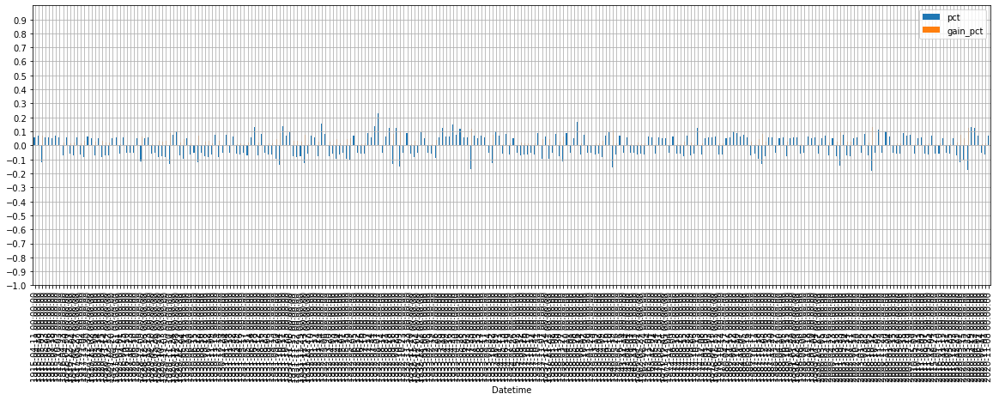

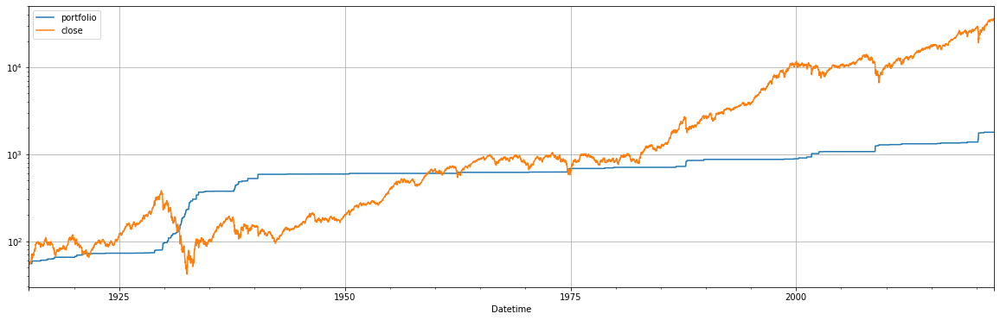

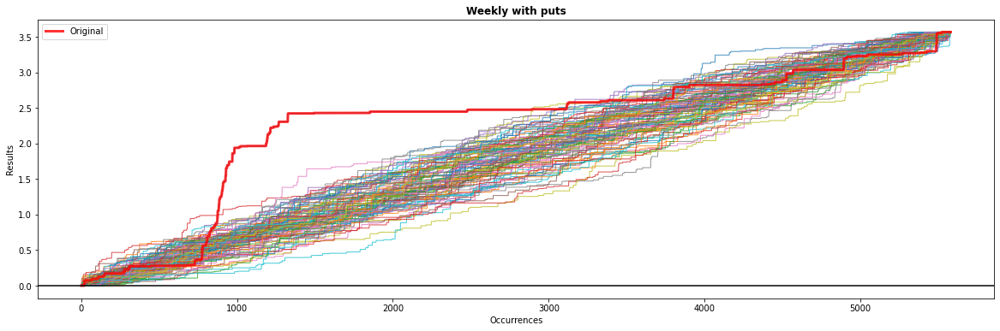

Weekly with puts {'min': 3.5706636160612106, 'max': 3.5706636160612106, 'mean': 3.5706636160612106, 'median': 3.5706636160612106, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


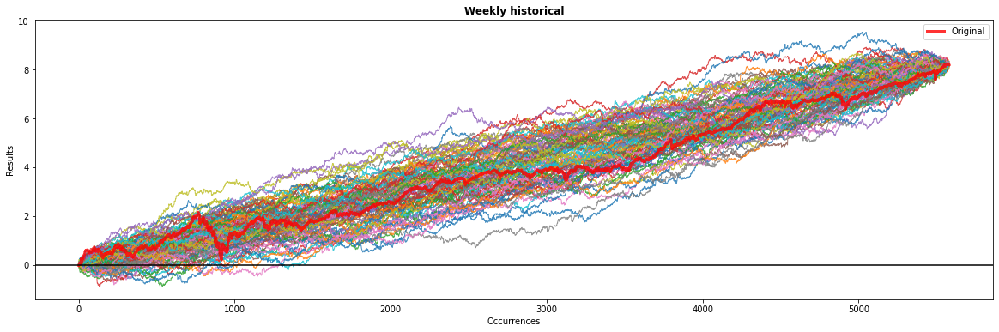

Weekly historical {'min': 8.198771, 'max': 8.198808, 'mean': 8.198786, 'median': 8.198786, 'std': 6.9728985e-06, 'maxdd': -0.89265597, 'bust': 0.28, 'goal': 0.72}


In [28]:
def gainFnPutsOnly(row, threshold):
    """ Function which returns the gains of an options contract."""
    if -row["pct"] > threshold:
        return -row["pct"] - threshold
    else:
        return 0

tailCapture(weekly, stdev_w*2, gainFn=gainFnPutsOnly)   
plot(weekly, stdev_w*2)
montecarlo(weekly, "Weekly with puts", "gain_pct")
montecarlo(weekly, "Weekly historical", "pct")

##### NOTES

* As we get more datapoints (number of datapoints at the weekly level is more than monthly), we find that it diverges instead of converging!
* Capturing *only* the puts or only the calls is not the right strategy

#### Weekly 3 SD

Strategy ending val  702.6614522670303 Discrete periods  5582 5582 Ending val buy and hold  34483.72 34483.66855370661
             pct   gain_pct
count  83.000000  83.000000
mean   -0.011651   0.031547
std     0.110812   0.030081
min    -0.181513   0.000140
25%    -0.095724   0.008257
50%    -0.076504   0.020698
75%     0.094650   0.050606
max     0.226686   0.151588 
                  pct  gain_pct
Datetime                      
1915-05-09 -0.122221  0.047123
1917-11-04 -0.083513  0.008415
1920-04-25 -0.083198  0.008100
1928-12-09 -0.115096  0.039998
1929-10-20 -0.081715  0.006617
...              ...       ...
2020-03-01 -0.123586  0.048488
2020-03-15 -0.103583  0.028485
2020-03-22 -0.173023  0.097925
2020-03-29  0.128445  0.053347
2020-04-12  0.126675  0.051577

[83 rows x 2 columns]
Longest streak of 0s:  1794
Longest streak of non 0s:  4


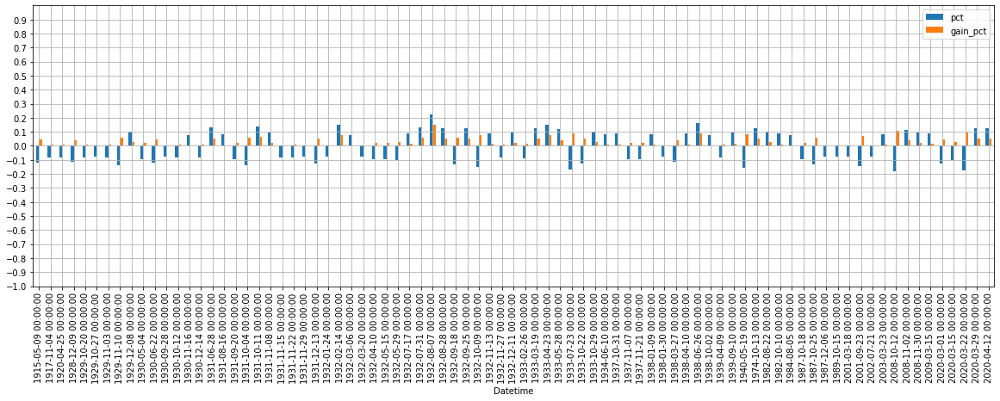

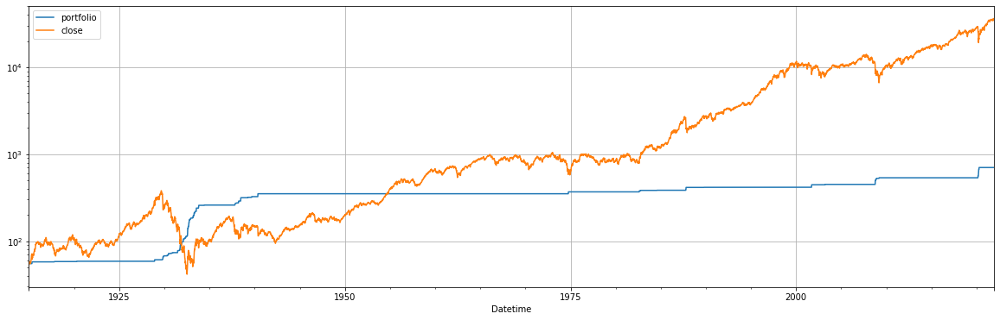

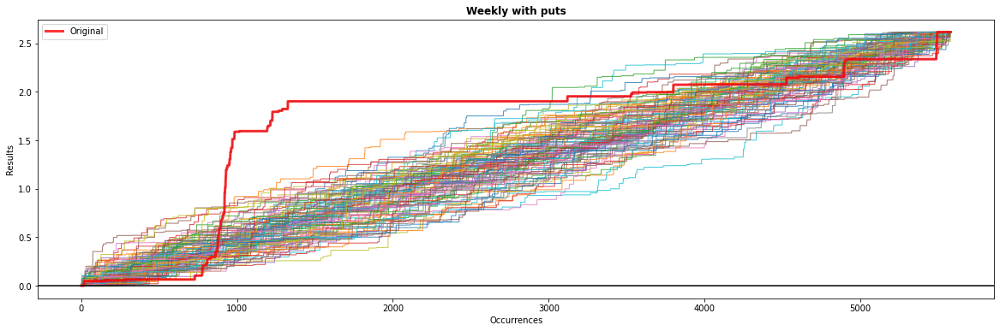

Weekly with puts {'min': 2.6184235624969006, 'max': 2.6184235624969006, 'mean': 2.6184235624969006, 'median': 2.6184235624969006, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


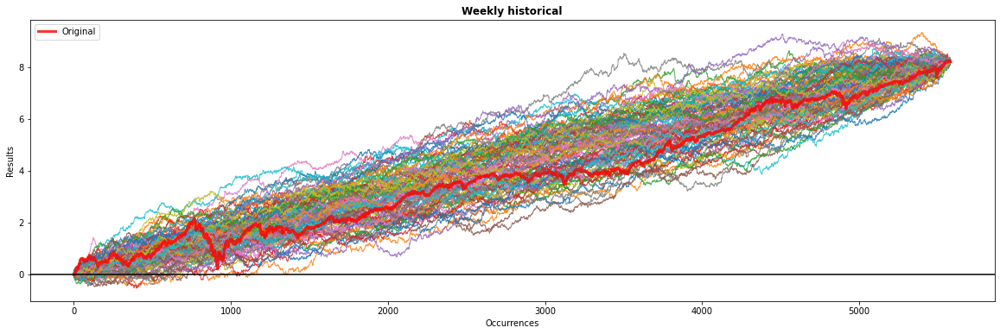

Weekly historical {'min': 8.198765, 'max': 8.198809, 'mean': 8.198786, 'median': 8.198785, 'std': 8.4969615e-06, 'maxdd': -0.5487586, 'bust': 0.22, 'goal': 0.78}


In [29]:
tailCapture(weekly, stdev_w*3)   
plot(weekly, stdev_w*3)
montecarlo(weekly, "Weekly with puts", "gain_pct")
montecarlo(weekly, "Weekly historical", "pct")

#### Daily 3SD

Strategy ending val  1027458.287416707 Discrete periods  39069 39069 Ending val buy and hold  34483.72 34483.845736697476
              pct    gain_pct
count  711.000000  711.000000
mean    -0.002768    0.014035
std      0.045921    0.017868
min     -0.226105    0.000021
25%     -0.037786    0.003135
50%     -0.029226    0.008209
75%      0.035363    0.018472
max      0.153417    0.197778 
                  pct  gain_pct
Datetime                      
1914-12-15 -0.029774  0.001447
1915-02-02  0.030041  0.001714
1915-04-09  0.029612  0.001284
1915-04-16  0.028775  0.000447
1915-05-05 -0.029463  0.001135
...              ...       ...
2020-06-05  0.031549  0.003221
2020-06-11 -0.068982  0.040654
2020-06-26 -0.028356  0.000029
2020-10-28 -0.034346  0.006018
2020-11-09  0.029466  0.001138

[711 rows x 2 columns]
Longest streak of 0s:  2371
Longest streak of non 0s:  5


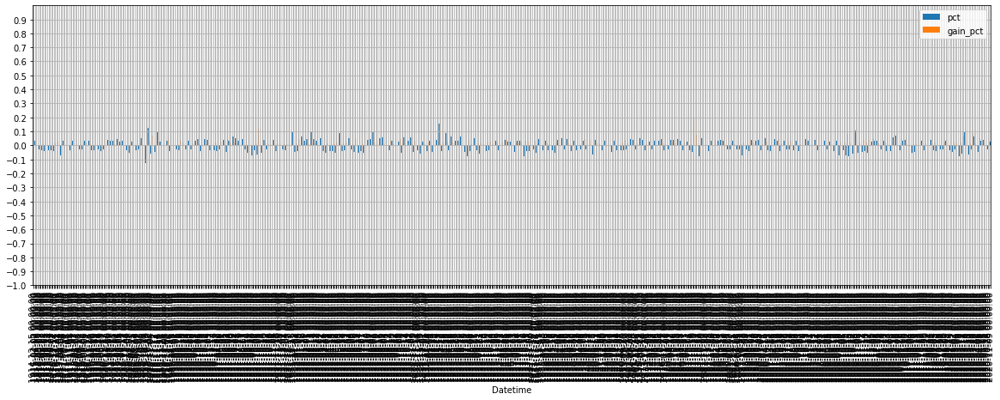

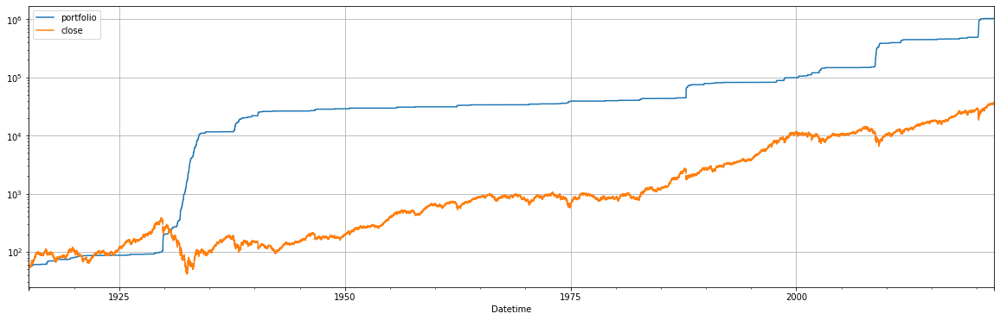

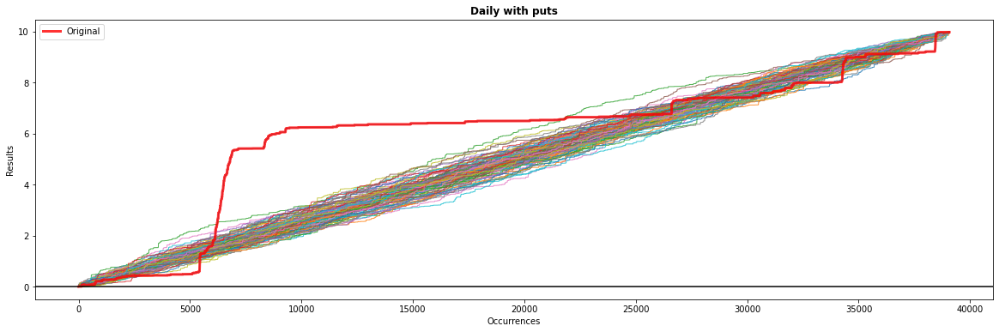

Daily with puts {'min': 9.979025024920702, 'max': 9.979025024920702, 'mean': 9.979025024920702, 'median': 9.979025024920702, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


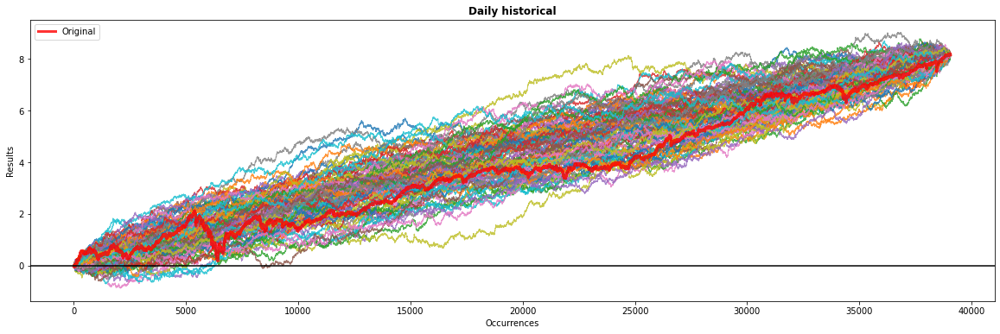

Daily historical {'min': 8.155957, 'max': 8.156057, 'mean': 8.156009, 'median': 8.156011, 'std': 1.9190946e-05, 'maxdd': -0.87878805, 'bust': 0.26, 'goal': 0.74}


In [30]:
tailCapture(daily, stdev_d*3)   
plot(daily, stdev_d*3)
montecarlo(daily, "Daily with puts", "gain_pct")
montecarlo(daily, "Daily historical", "pct")

#### 3.5SD - 99.98%

Strategy ending val  69168.93213368767 Discrete periods  39069 39069 Ending val buy and hold  34483.72 34483.845736697476
              pct    gain_pct
count  472.000000  472.000000
mean    -0.002839    0.015343
std      0.052064    0.019286
min     -0.226105    0.000010
25%     -0.042682    0.003557
50%     -0.034332    0.009367
75%      0.041955    0.018909
max      0.153417    0.193056 
                  pct  gain_pct
Datetime                      
1915-05-07 -0.045435  0.012386
1915-05-08 -0.036235  0.003186
1915-05-11  0.041573  0.008524
1915-05-14 -0.041739  0.008690
1916-04-22 -0.035751  0.002702
...              ...       ...
2020-04-06  0.077305  0.044256
2020-04-08  0.034418  0.001369
2020-05-18  0.038503  0.005454
2020-06-11 -0.068982  0.035933
2020-10-28 -0.034346  0.001297

[472 rows x 2 columns]
Longest streak of 0s:  2373
Longest streak of non 0s:  5


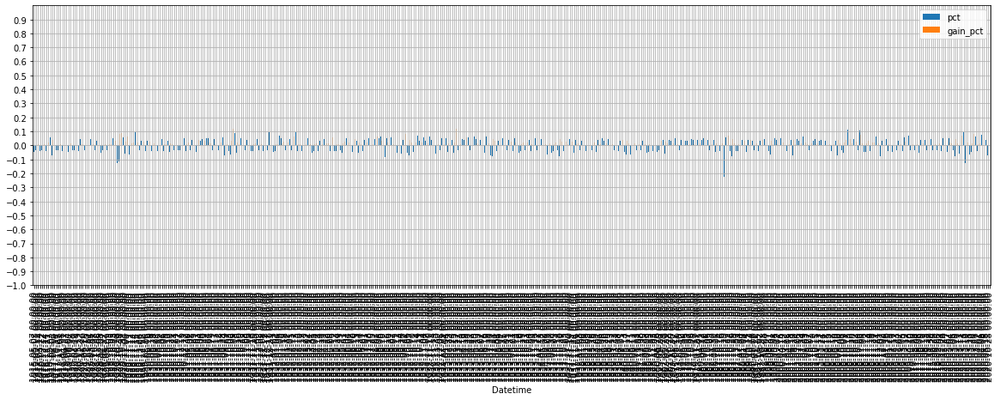

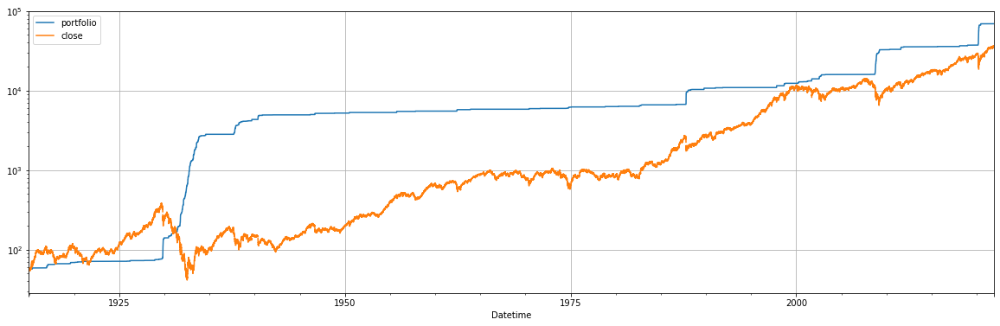

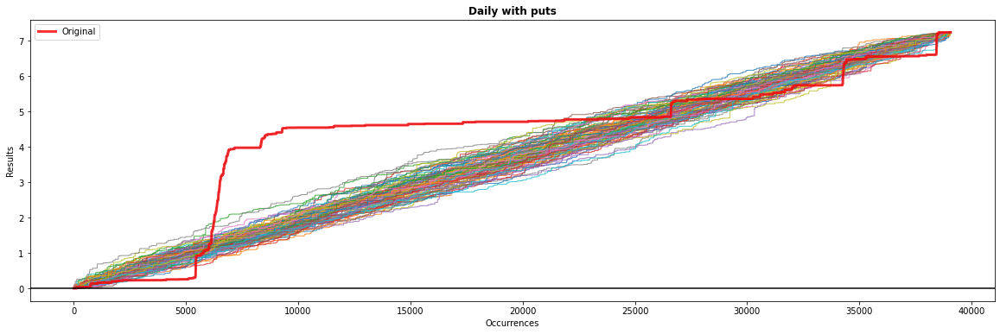

Daily with puts {'min': 7.241952553391457, 'max': 7.241952553391457, 'mean': 7.241952553391457, 'median': 7.241952553391457, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


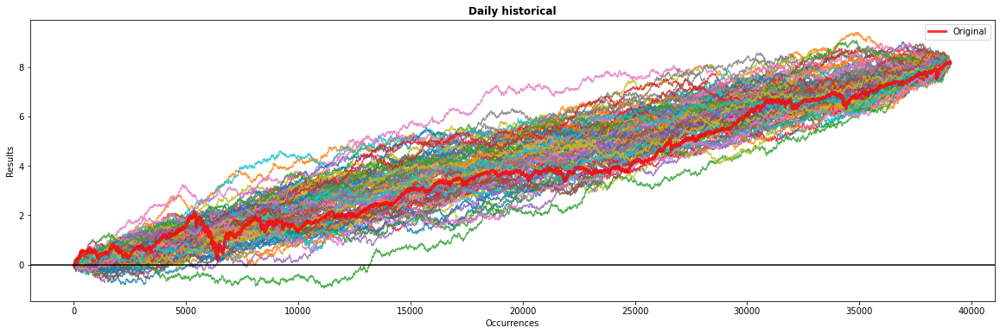

Daily historical {'min': 8.155959, 'max': 8.156093, 'mean': 8.156009, 'median': 8.156006, 'std': 2.3371666e-05, 'maxdd': -0.9549865, 'bust': 0.24, 'goal': 0.76}


In [31]:
tailCapture(daily, stdev_d*3.5)   
plot(daily, stdev_d*3.5)
montecarlo(daily, "Daily with puts", "gain_pct")
montecarlo(daily, "Daily historical", "pct")

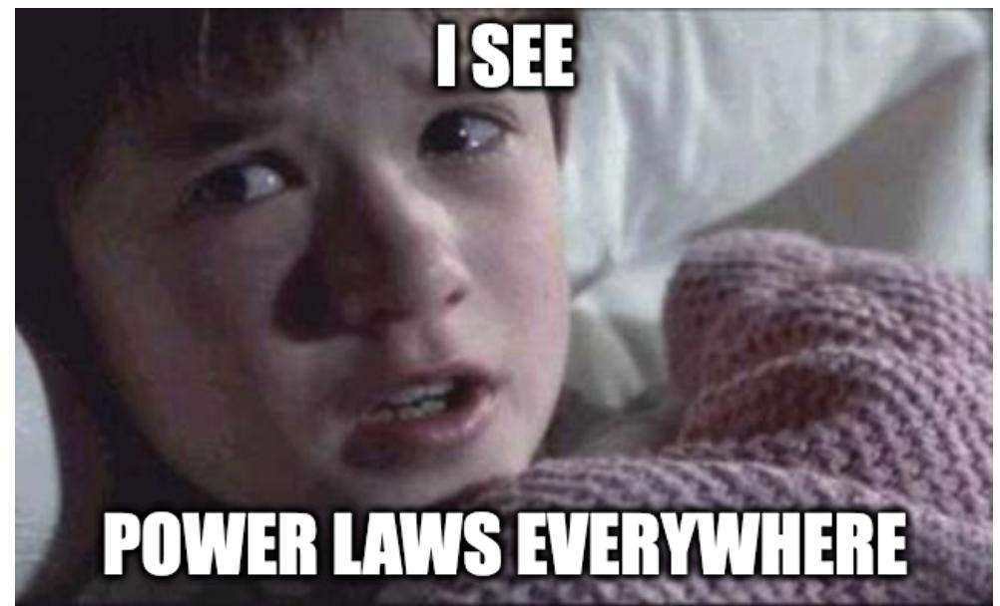

In [32]:

Image(filename='signal-2021-11-25-094601_001.jpeg', width=500)

## *If we are facing in the right direction all we have to do is keep on walking.* -Zen proverb

# With cost of options

In [33]:
# Cost of options is percentage expense, always positive.
def tailCapture(df, winThreshold, costOfOptions=0, gainFn=gainFn):
    df["gain_pct"] = df.apply(lambda row: gainFn(row, winThreshold), axis=1)

    startingPortfolioVal = df.head(1)["close"].values[0]
    portfolioVal = startingPortfolioVal
    oldPfVal = startingPortfolioVal  # Only for sanity checks
    pfList = [startingPortfolioVal]
    # shift the gain by 1 week for comparison and iterate over all rows of df2
    for _, row in df.shift(-1).iterrows():
        if np.isnan(row["gain_pct"]):
            continue
        portfolioVal = portfolioVal * (1 - costOfOptions)
        portfolioVal += portfolioVal * row["gain_pct"]
        oldPfVal += oldPfVal * row["pct"] # For sanity checks
        pfList.append(portfolioVal)
    df["portfolio"] = pfList
    print(
        "Strategy ending val ",
        portfolioVal,
        "Discrete periods ",
        len(pfList),
        len(df),
        "Ending val buy and hold ",
        df.tail(1)["close"].values[0],
        oldPfVal,
    )


Strategy ending val  3192.696856030787 Discrete periods  1801 1801 Ending val buy and hold  3793.748421052632 3793.748421052611
              pct    gain_pct
count  395.000000  395.000000
mean     0.004781    0.026755
std      0.077602    0.038521
min     -0.264737    0.000041
25%     -0.054922    0.006402
50%      0.042697    0.016186
75%      0.057282    0.031290
max      0.502994    0.462298 
            pct  gain_pct
16   -0.051653  0.010957
39   -0.076459  0.035763
40   -0.087146  0.046450
42    0.094059  0.053363
43    0.054299  0.013602
...        ...       ...
1798  0.041314  0.000618
1799  0.057075  0.016379
1800  0.063380  0.022684
1802  0.057392  0.016696
1806  0.041228  0.000532

[395 rows x 2 columns]
Longest streak of 0s:  48
Longest streak of non 0s:  7


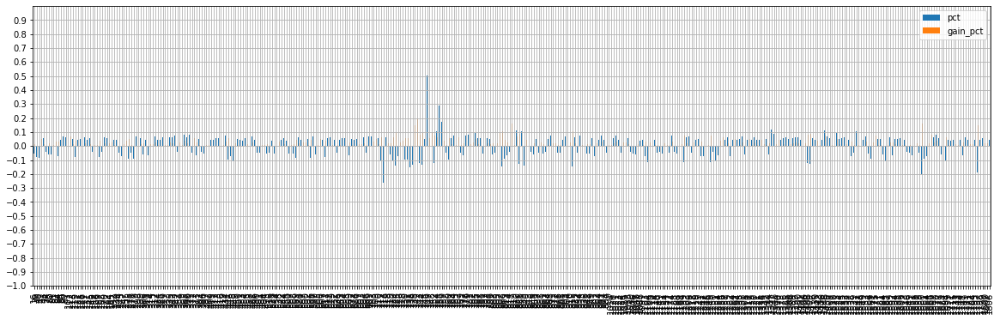

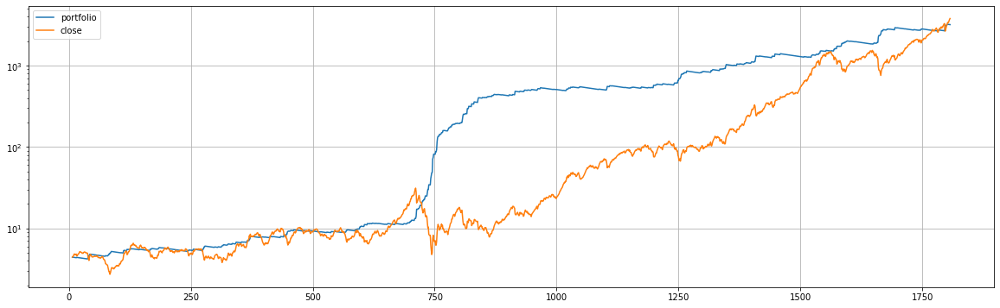

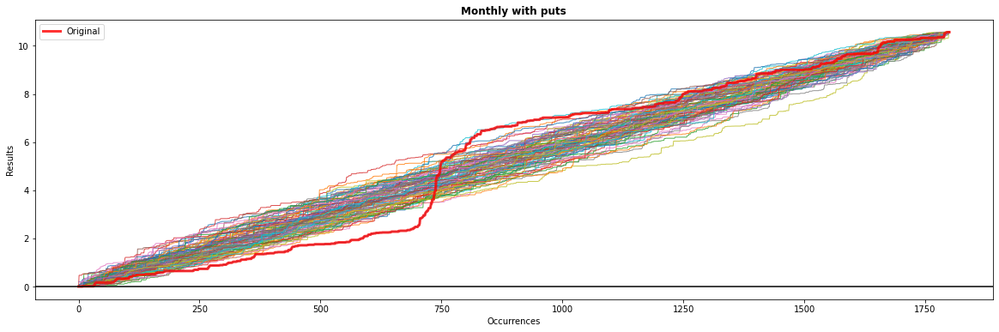

Monthly with puts {'min': 10.568074679105997, 'max': 10.568074679106035, 'mean': 10.568074679106012, 'median': 10.56807467910601, 'std': 6.150890202460198e-15, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


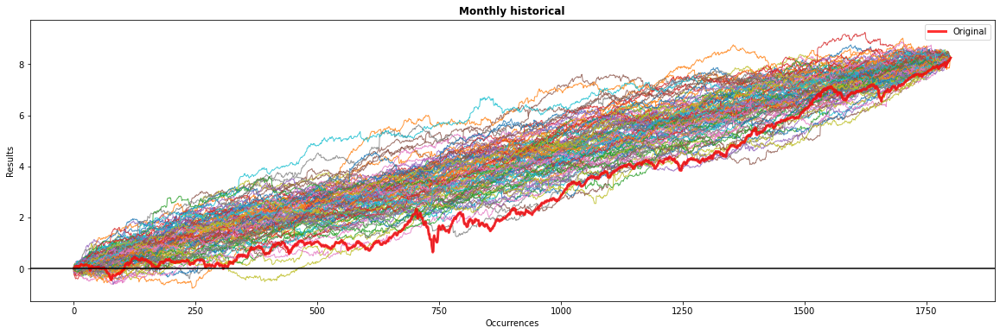

Monthly historical {'min': 8.250132331879206, 'max': 8.250132331879247, 'mean': 8.250132331879227, 'median': 8.250132331879225, 'std': 9.043591587410585e-15, 'maxdd': -0.7735771186319575, 'bust': 0.21, 'goal': 0.79}


In [34]:
tailCapture(monthly, stdev_m, costOfOptions=0.2/100)   
plot(monthly, stdev_m)
montecarlo(monthly, "Monthly with puts", "gain_pct")
montecarlo(monthly, "Monthly historical", "pct")

In [35]:
monthly[700:800][["close", "pct", "gain_pct", "portfolio"]].head(60).tail(20)

,close,pct,gain_pct,portfolio
747,8.26,0.096946,0.056249,74.801173
748,7.12,-0.138015,0.097318,81.916540
749,7.05,-0.009831,0.000000,81.752707
750,6.82,-0.032624,0.000000,81.589202
751,7.09,0.039589,0.000000,81.426024
752,6.25,-0.118477,0.077781,87.583868
753,6.23,-0.003200,0.000000,87.408700
754,6.89,0.105939,0.065243,92.925271
755,8.87,0.287373,0.246677,115.616089
756,10.39,0.171364,0.130668,130.461966


Strategy ending val  7135.337365167075 Discrete periods  1801 1801 Ending val buy and hold  3793.748421052632 3793.748421052611
             pct   gain_pct
count  70.000000  70.000000
mean   -0.035129   0.043708
std     0.135881   0.061958
min    -0.264737   0.000462
25%    -0.120222   0.010923
50%    -0.092605   0.026120
75%     0.091630   0.050254
max     0.502994   0.421602 
            pct  gain_pct
40   -0.087146  0.005754
42    0.094059  0.012667
112   0.109005  0.027612
275  -0.088512  0.007120
277  -0.093275  0.011883
...        ...       ...
1660 -0.203911  0.122519
1661 -0.088522  0.007130
1666  0.120217  0.038825
1694 -0.105555  0.024162
1797 -0.190681  0.109288

[70 rows x 2 columns]
Longest streak of 0s:  188
Longest streak of non 0s:  3


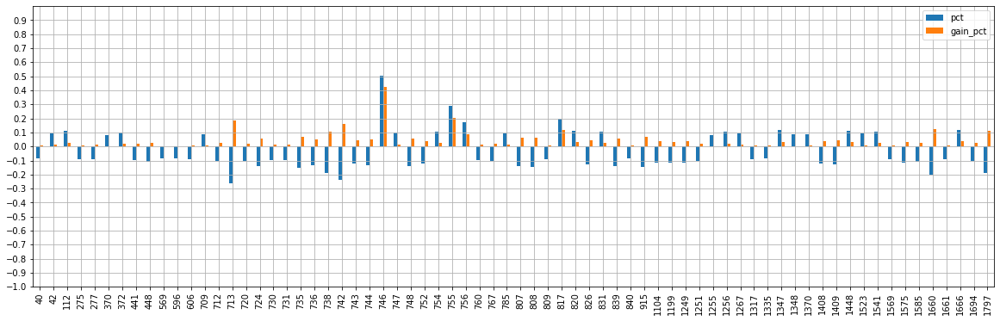

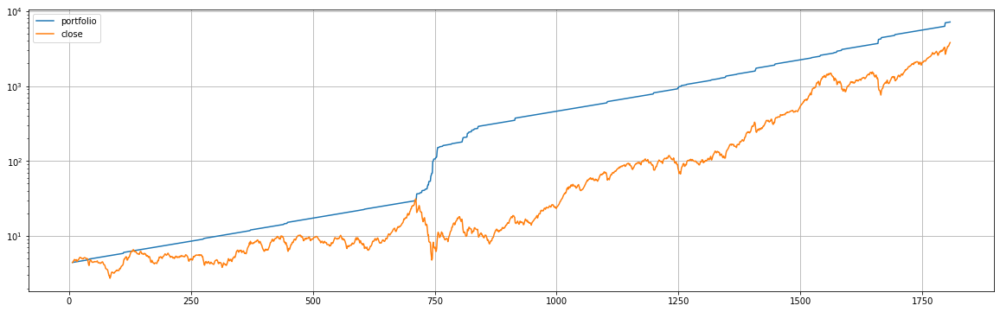

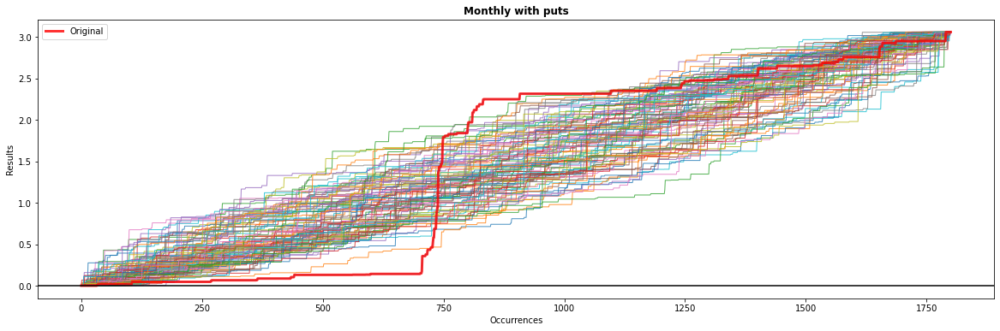

Monthly with puts {'min': 3.0595460908036385, 'max': 3.059546090803642, 'mean': 3.05954609080364, 'median': 3.0595460908036403, 'std': 8.859327058163318e-16, 'maxdd': nan, 'bust': 0.0, 'goal': 1.0}


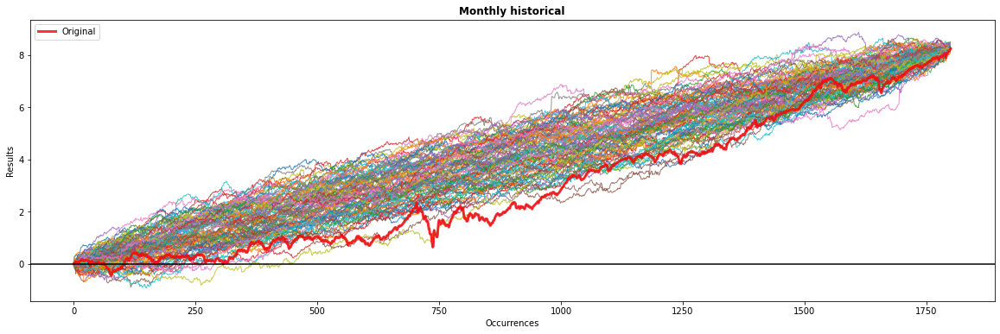

Monthly historical {'min': 8.250132331879206, 'max': 8.250132331879247, 'mean': 8.250132331879227, 'median': 8.250132331879225, 'std': 8.621381995605899e-15, 'maxdd': -0.9341874709883095, 'bust': 0.27, 'goal': 0.73}


In [36]:
# How much interest does the rest of the pf need to make for 2SD capture?
costOfOptions = 0.2/100
interest = 0.45/100
tailCapture(monthly, stdev_m*2, costOfOptions=(costOfOptions-interest))   
plot(monthly, stdev_m*2)
montecarlo(monthly, "Monthly with puts", "gain_pct")
montecarlo(monthly, "Monthly historical", "pct")

### NOTE: This is just past data analysis, the only certainty is that the future will NOT resemble the past!

# With insurance (rest of the pf invested in mkt)

In [37]:

# Cost of options is percentage expense, always positive.
def insured(df, winThreshold, costOfOptions=0, gainFn=gainFnPutsOnly):
    df["gain_pct"] = df.apply(lambda row: gainFn(row, winThreshold), axis=1)

    startingPortfolioVal = df.head(1)["close"].values[0]
    portfolioVal = startingPortfolioVal
    oldPfVal = startingPortfolioVal  # Only for sanity checks
    pfList = [startingPortfolioVal]
    # shift the gain by 1 week for comparison and iterate over all rows of df2
    for _, row in df.shift(-1).iterrows():
        if np.isnan(row["gain_pct"]):
            continue

        marketPfStartVal = portfolioVal * (1 - costOfOptions)
        marketPfEndVal = marketPfStartVal * (1 + row["pct"])

        putsGain = portfolioVal * row["gain_pct"]
        portfolioVal = marketPfEndVal + putsGain
        oldPfVal += oldPfVal * row["pct"] # For sanity checks
        pfList.append(portfolioVal)
    df["portfolio"] = pfList
    print(
        "Strategy ending val ",
        portfolioVal,
        "Discrete periods ",
        len(pfList),
        len(df),
        "Ending val buy and hold ",
        df.tail(1)["close"].values[0],
        oldPfVal,
    )


Strategy ending val  5255.571345645055 Discrete periods  1801 1801 Ending val buy and hold  3793.748421052632 3793.748421052611
             pct   gain_pct
count  70.000000  70.000000
mean   -0.035129   0.026628
std     0.135881   0.037662
min    -0.264737   0.000000
25%    -0.120222   0.000000
50%    -0.092605   0.011212
75%     0.091630   0.038829
max     0.502994   0.183345 
            pct  gain_pct
40   -0.087146  0.005754
42    0.094059  0.000000
112   0.109005  0.000000
275  -0.088512  0.007120
277  -0.093275  0.011883
...        ...       ...
1660 -0.203911  0.122519
1661 -0.088522  0.007130
1666  0.120217  0.000000
1694 -0.105555  0.024162
1797 -0.190681  0.109288

[70 rows x 2 columns]
Longest streak of 0s:  234
Longest streak of non 0s:  3


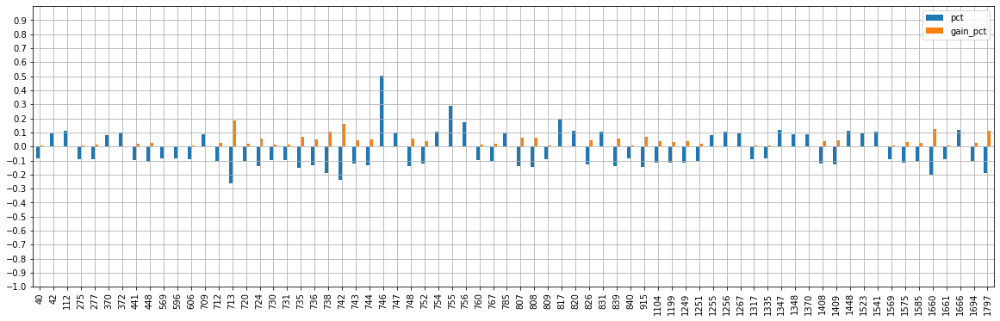

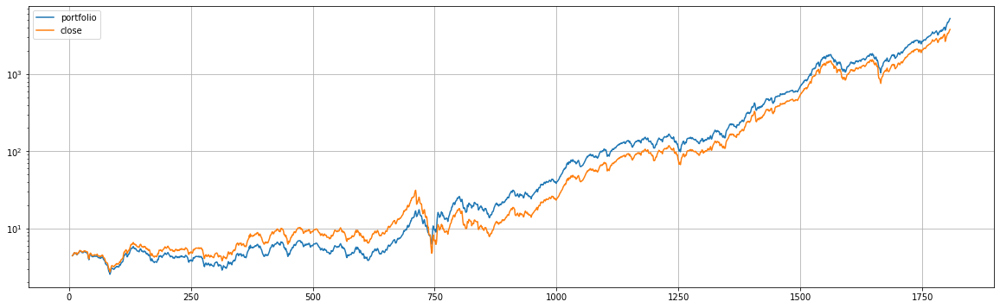

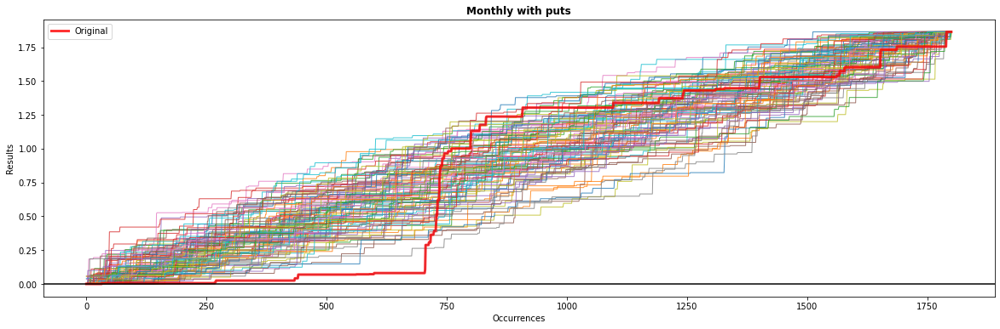

Monthly with puts {'min': 1.8639581367391969, 'max': 1.8639581367391982, 'mean': 1.8639581367391975, 'median': 1.8639581367391975, 'std': 2.840404129974911e-16, 'maxdd': nan, 'bust': 0.0, 'goal': 0.0}


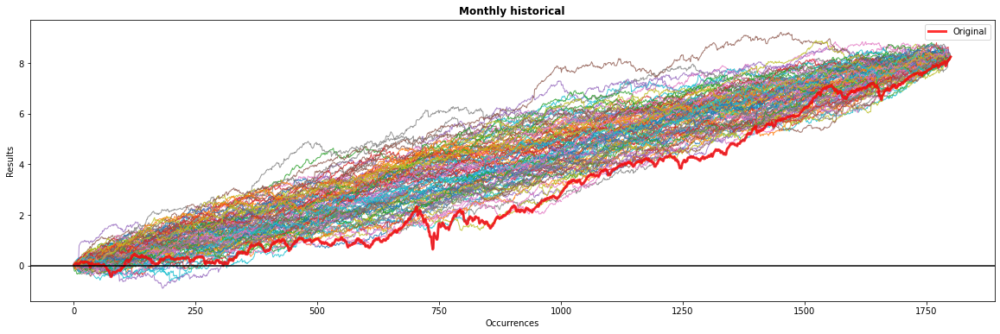

Monthly historical {'min': 8.2501323318792, 'max': 8.250132331879247, 'mean': 8.250132331879223, 'median': 8.250132331879225, 'std': 8.995886463651879e-15, 'maxdd': -0.9004499600944241, 'bust': 0.2, 'goal': 0.8}


In [38]:

insured(monthly, stdev_m*2, gainFn=gainFnPutsOnly, costOfOptions=0.1/100)   
plot(monthly, stdev_m*2)
montecarlo(monthly, "Monthly with puts", "gain_pct")
montecarlo(monthly, "Monthly historical", "pct")

Strategy ending val  30182.765737784055 Discrete periods  5582 5582 Ending val buy and hold  34483.72 34483.66855370661
             pct   gain_pct
count  83.000000  83.000000
mean   -0.011651   0.016623
std     0.110812   0.026306
min    -0.181513   0.000000
25%    -0.095724   0.000000
50%    -0.076504   0.001406
75%     0.094650   0.020626
max     0.226686   0.106415 
                  pct  gain_pct
Datetime                      
1915-05-09 -0.122221  0.047123
1917-11-04 -0.083513  0.008415
1920-04-25 -0.083198  0.008100
1928-12-09 -0.115096  0.039998
1929-10-20 -0.081715  0.006617
...              ...       ...
2020-03-01 -0.123586  0.048488
2020-03-15 -0.103583  0.028485
2020-03-22 -0.173023  0.097925
2020-03-29  0.128445  0.000000
2020-04-12  0.126675  0.000000

[83 rows x 2 columns]
Longest streak of 0s:  2473
Longest streak of non 0s:  4


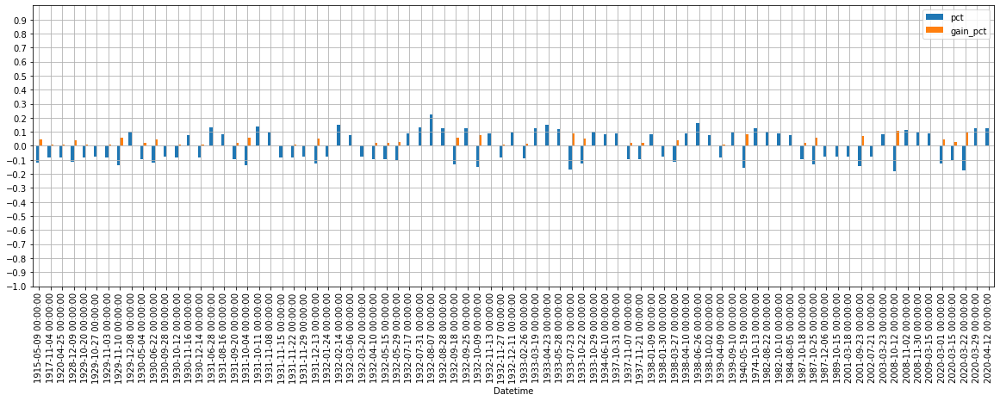

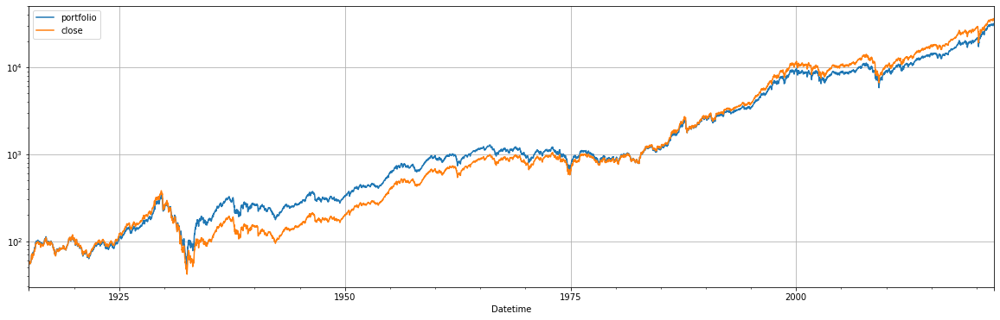

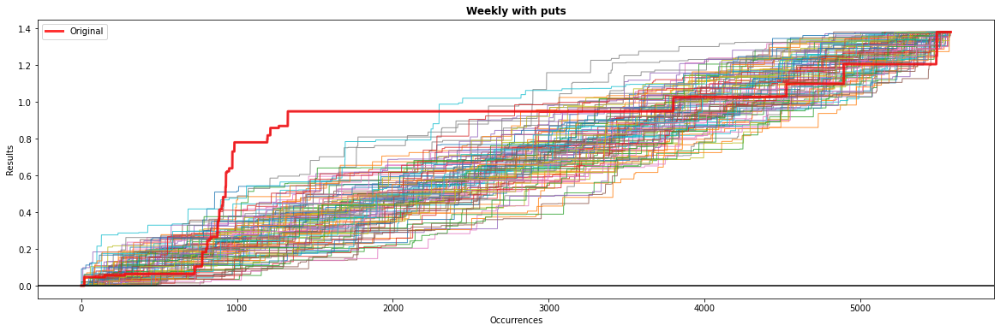

Weekly with puts {'min': 1.3796946667134762, 'max': 1.3796946667134762, 'mean': 1.3796946667134762, 'median': 1.3796946667134762, 'std': 0.0, 'maxdd': nan, 'bust': 0.0, 'goal': 0.0}


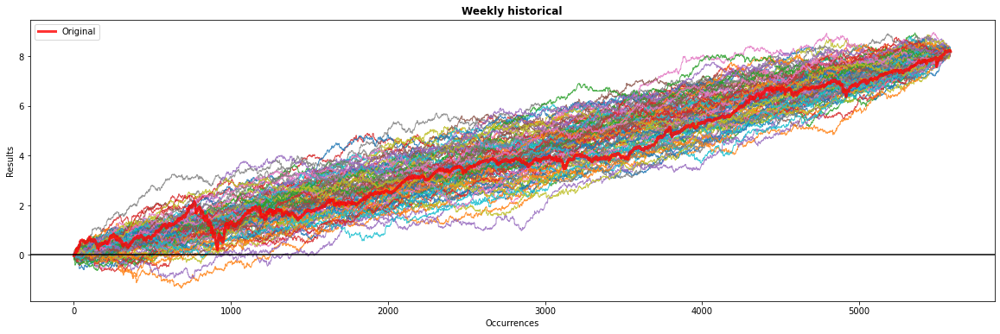

Weekly historical {'min': 8.19876, 'max': 8.198801, 'mean': 8.198784, 'median': 8.198784, 'std': 7.724435e-06, 'maxdd': -1.3380928, 'bust': 0.31, 'goal': 0.69}


In [39]:

insured(weekly, stdev_w*3, gainFn=gainFnPutsOnly, costOfOptions=0.03/100)   
plot(weekly, stdev_w*3)
montecarlo(weekly, "Weekly with puts", "gain_pct")
montecarlo(weekly, "Weekly historical", "pct")

#### NOTES

* Sounds simple, but there was a period of 47yrs or so where nothing happened! With 3 SD, the period between the strategy working can be so long that you might die in the interim. (The Tartar Steppe story in which Giovanni Drogo is posted on the Bastianni Fortress)

## *The journey of a thousand miles, begins with a single step* -Tao Te Ching

In [40]:
# If you want to dump to csv
# df2["power"] = pfList
# df2.to_csv("/Users/shan/Documents/power3.csv", index=False)

# Hill estimator

In [41]:
import numpy as np

def Hill_estimator(data):
    """
    Returns the Hill Estimators for some 1D data set.
    """    
    # sort data in such way that the smallest value is first and the largest value comes last:
    Y = np.sort(data)
    n = len(Y)

    Hill_est = np.zeros(n-1)

    for k in range(0, n-1):    # k = 0,...,n-2
        summ = 0

        for i in range(0,k+1):   # i = 0, ..., k
            summ += np.log(Y[n-1-i]) - np.log(Y[n-2-k])
        
        Hill_est[k] = (1 / (k+1)) * summ      # add 1 to k because of Python syntax
  
    kappa = 1. / Hill_est
    return kappa

In [ ]:
""" Compute Hill Estimator for Gains """
from matplotlib import pyplot as plt
from time import time
 
weeklypos = daily[daily["pct"] > 0].copy()
weeklypos.reset_index(drop=True, inplace=True)

n_obs = len(weeklypos)
k_max = int(round(0.1*n_obs))
k_min = 10

print("[INFO] computing Hill Estimators...")
t0 = time()

kap_gains = Hill_estimator(weeklypos['pct'].to_numpy())

print ("        done in %0.3f minutes" % ((time() - t0)/60))
print ("")

print ("Sample size n:", n_obs)
print ("Total number of exceeded k:", len(kap_gains))

[INFO] computing Hill Estimators...


In [ ]:
""" Hill Plot for Gains for k in range (10,...,round(0.1*n_obs)) """

plt.figure(figsize=(15, 6))
plt.plot(np.arange(k_min,k_max), kap_gains[k_min-1:k_max-1], 'green')
plt.xlabel("$k$ (number of order statistics)", fontsize=18)
plt.ylabel("$\kappa$ (Hill Estimate)", fontsize=18)
plt.title("Hill Plot over S&P 500 Gains (right tail)", fontsize=20)
plt.show()

In [ ]:
""" Compute Hill Estimator for Losses """

weeklyneg = weekly[weekly["pct"] < 0].copy()
weeklyneg.reset_index(drop=True, inplace=True)

n_obs = len(weeklyneg)
k_max = int(round(0.1*n_obs))
k_min = 10

print("[INFO] computing Hill Estimators...")
t0 = time()

kap_loss = Hill_estimator(abs(weeklyneg['pct']).to_numpy())

print ("        done in %0.3f minutes" % ((time() - t0)/60))
print ("")

print ("Sample size n:", n_obs)
print ("Total number of exceeded k:", len(kap_loss))

In [ ]:
""" Hill Plot for Gains for k in range (10,...,round(0.1*n_obs)) """

plt.figure(figsize=(15, 6))
plt.plot(np.arange(k_min,k_max), kap_loss[k_min-1:k_max-1], 'red')
plt.xlabel("$k$ (number of order statistics)", fontsize=18)
plt.ylabel("$\kappa$ (Hill Estimate)", fontsize=18)
plt.title("Hill Plot over S&P 500 Losses (left tail)", fontsize=20)
plt.show()